# The Hamilton Filter


[*********************100%%**********************]  1 of 1 completed


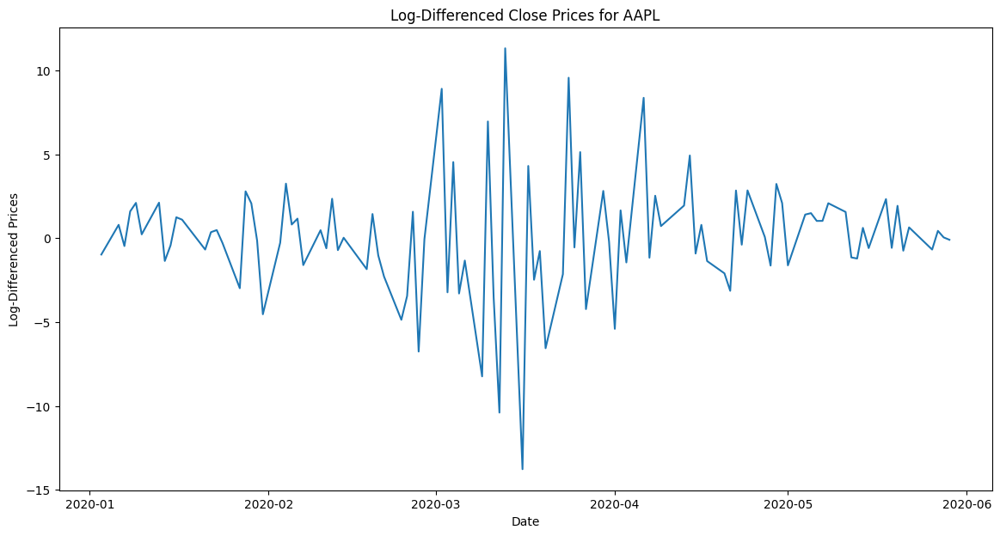

102

In [3]:
import yfinance as yf
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.optimize import minimize
# Download stock data
ticker = 'AAPL'  # Example: Apple Inc.
data = yf.download(ticker, start='2020-01-01', end='2020-06-01')['Close']

# Transform the data: log and first difference
log_data = np.log(data)
diff_log_data = log_data.diff().dropna()*100

# Plot the transformed data
plt.figure(figsize=(14, 7))
plt.plot(diff_log_data)
plt.title(f'Log-Differenced Close Prices for {ticker}')
plt.xlabel('Date')
plt.ylabel('Log-Differenced Prices')
plt.show()

# Convert to numpy array for use with the SVModel
transformed_data = diff_log_data.to_numpy()
transformed_data.size


# The Steps of the Algorithm
### The distribution of $x_t$ is given by
$$f(x_t|X_{0:t-1})=\sum_{i=1}^Nf(x_t|s_t=i)P(s_t=i|X_{0:t-1})$$

### The likeliood contribution


### The Predicition Step:
$$P(s_t=i|X_{0:t-1})=\sum_{j=i}^Np_{ji} P(s_{t-1}=j|X_{0:t-1})$$

### The Filtering Step:
$$P(s_t=i|X_{0:t})=\frac{f(x_t|s_t=i)P(s_t=i|X_{0:t-1})}{\sum_{j=1}^Nf(x_t|s_t=j)P(s_t=j|X_{0:t-1})}$$

In [ ]:
n_states=2

def parameterize(params):
    """
    takes parameters,
    creates: 
        p_00, p_11
        the sigmas   

    ! This is not expanded to fit n_states!   
    """
    p_00 = params[0]
    p_11 = params[1]
    sigma = params[2:4] ** 2;
    
    return p_00, p_11, sigma

def create_transition_matrix(p_00, p_11):
    """
    Create the Transition Matrix 

    ! This is not expanded to fit n_states!
    """
    transition_matrix = np.zeros([2, 2])
    transition_matrix[0] = p_00, 1 - p_11
    transition_matrix[1] = 1 - p_00, p_11
    return transition_matrix

def calculate_initial_probabilities(transition_matrix):
    """
    Use linalg to find the initial probabilities:

    ! This is not expanded to fit n_states!
    """
    A_matrix = np.vstack(((np.identity(2)- transition_matrix), np.ones([1,2])))
    pi_first = np.linalg.inv(A_matrix.T.dot(A_matrix)).dot(A_matrix.T)
    pi_second = np.vstack((np.zeros([2,1]), np.ones([1,1])))
    initial_probs = pi_first.dot(pi_second)
    initial_probabilities = initial_probs.T
    return initial_probabilities

def density_function(t, state,sigma, mu, phi):
    return np.exp(-0.5 * np.log(2 * np.pi) - 0.5 * np.log(sigma[state]) - 0.5 * ((data[t] - mu[state] - phi[state] * data[t-1]) ** 2) / sigma[state])


def prediction_step(transition_matrix, filtered_probabilities, t):
    """
    Use the dot product of the transition_matrix and the filtered_probability
    """  
    predictions = transition_matrix.dot(filtered_probabilities[:,t])
    return predictions

def filtering_step(partial_likelihood, likelihood_contributions, t):
    """
    For State in n_states
        Set filtered_pribabilities for a stateequal to partial_likelihood for the state divided by total likelihood.
    """
    filtered = np.zeros(n_states)
    for state in range(n_states):
        filtered[state] = partial_likelihood[state] / likelihood_contributions[t]
    return filtered

def objective(initial_guess):
    """
    Setup Arrays for Book Keeping
    Create Parameters
    for t in rainge(num_obs):
        ...
    """
    # For Book Keeping
    num_obs = len(data)
    predicted_probabilities = np.zeros([n_states, num_obs+1])
    filtered_probabilities = np.zeros([n_states, num_obs])
    smoothed_probabilities = np.zeros([n_states, num_obs])
    likelihood_contributions = np.zeros(num_obs)

    # For testing other parameters
    phi = np.zeros(2)
    mu = np.zeros(2)
    # Form Model Parameters
    p_00, p_11, sigma = parameterize(initial_guess)

    # Form Transition Matrix
    transition_matrix = create_transition_matrix(p_00, p_11)

    # Form Initial Probabilities
    predicted_probabilities[[0,1],0] = calculate_initial_probabilities(transition_matrix)

    # To Hold values of Forward Filter Recursions
    eta = np.zeros(n_states)

    # To Hold values of Partial Log-Likelihoods.
    partial_likelihood = np.zeros(n_states)

    # The Main For Loop:
    for t in range(num_obs):
        # Calculate State Densities
        for state in range(n_states):
            eta[state] = density_function(t, state, sigma, mu, phi)
            partial_likelihood[state] = predicted_probabilities[state,t] * eta[state]

        # Calculate the Log-Likelihood

        likelihood_contributions[t] = np.log(np.sum(partial_likelihood))

        # Calculate the Filtering Step
        """
        For State in n_states
            Set filtered_pribabilities for a stateequal to partial_likelihood for the state divided by total likelihood.
        """
        filtered = np.zeros(n_states)
        for state in range(n_states):
            filtered_probabilities[state] = partial_likelihood[state] / likelihood_contributions[t]
            # filtered_probabilities[:,t] = filtering_step(partial_likelihood, likelihood_contributions, t)

        # Calculate the Prediction step
        predicted_probabilities[:, t+1] = prediction_step(transition_matrix, filtered_probabilities, t)
        print(f' Likelihood Value :  {likelihood_contributions[t]}')
        print(f'  Predicted Probability:  {predicted_probabilities[:, t+1]}')
        print(f' Filtered Probability :  {filtered_probabilities[:,t] }')
        print(f'Eta  :  {eta}')
        print(f'Partial Likelihood  :  {partial_likelihood}')
    # Return the Negative Sum of the Log-Likelihood
    
    negative_likelihood = -np.sum(likelihood_contributions)

    return negative_likelihood
def fit(data):
    """
    Minimize the objective Function
        Use initial Guess, constraints, bounds, and arguments.
        Print results.
    """

    # Initial Guesses
    variance = np.var(data)
    initial_guess= np.array([0.9, 0.9, np.sqrt(2*variance), np.sqrt(0.5*variance)])

    # Parameter Bounds
    my_bounds = bounds=((0.001,0.9999),(0.001,0.9999),(0.01,None),(0.01,None))

    # Missing: Constraint, args 


    res = minimize(objective, initial_guess, method='L-BFGS-B', bounds=my_bounds) # constraint=cons,arg=args)

    # Hessian, standard errors, print etc
    res.x
    v_hessian = res.hess_inv.todense()
    se_hessian = np.sqrt(np.diagonal(v_hessian))

    # The Results:
    estimated_parameters = res.x
    se = se_hessian
    print('P11='+str(estimated_parameters[0])+', std.errors='+str(se[0]))
    print('P22='+str(estimated_parameters[1])+', std.errors='+str(se[1]))
    print('h1='+str(estimated_parameters[2])+', std.errors='+str(se[2]))
    print('h2='+str(estimated_parameters[3])+', std.errors='+str(se[3]))


my_fitted = fit(data)

/tmp/ipykernel_124326/2401261928.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.exp(-0.5 * np.log(2 * np.pi) - 0.5 * np.log(sigma[state]) - 0.5 * ((data[t] - mu[state] - phi[state] * data[t-1]) ** 2) / sigma[state])
/tmp/ipykernel_124326/2401261928.py:104: RuntimeWarning: invalid value encountered in log
  likelihood_contributions[t] = np.log(np.sum(partial_likelihood))


 Likelihood Value :  -6.692288129454784
  Predicted Probability:  [-1.60552602e-04 -2.48012273e-05]
 Filtered Probability :  [-1.77521524e-04 -7.83230545e-06]
Eta  :  [0.00237605 0.00010483]
Partial Likelihood  :  [1.18802519e-03 5.24160448e-05]
 Likelihood Value :  nan
  Predicted Probability:  [nan nan]
 Filtered Probability :  [nan nan]
Eta  :  [0.00243523 0.00011567]
Partial Likelihood  :  [-3.90981736e-07 -2.86880697e-09]
 Likelihood Value :  nan
  Predicted Probability:  [nan nan]
 Filtered Probability :  [nan nan]
Eta  :  [0.00238713 0.0001068 ]
Partial Likelihood  :  [nan nan]
 Likelihood Value :  nan
  Predicted Probability:  [nan nan]
 Filtered Probability :  [nan nan]
Eta  :  [0.00241567 0.000112  ]
Partial Likelihood  :  [nan nan]
 Likelihood Value :  nan
  Predicted Probability:  [nan nan]
 Filtered Probability :  [nan nan]
Eta  :  [2.31934206e-03 9.51767526e-05]
Partial Likelihood  :  [nan nan]
 Likelihood Value :  nan
  Predicted Probability:  [nan nan]
 Filtered Probabi